# Load model

In [7]:
path_images = '/scratch/ndillenb/books_images'
path_model = '/scratch/ndillenb/trained_model_saved/4epoch_fixed4_27_03_2023.pt'

In [8]:
import torch
import torch.nn as nn
import torch.optim as optim
# Additional information
model = torch.load(path_model)

# Define prediction function 

In [7]:
%matplotlib inline
from PIL import Image
import matplotlib.pyplot as plt
import torch
import torchvision.transforms as T
import torchvision
import numpy as np

import cv2
import random
import warnings
warnings.filterwarnings('ignore')


def get_prediction(img_path, confidence, disable_confidence):
    """
    get_prediction
    parameters:
      - img_path - path of the input image
      - confidence - threshold value for prediction score
    method:
      - Image is obtained from the image path
      - the image is converted to image tensor using PyTorch's Transforms
      - image is passed through the model to get the predictions
      - class, box coordinates are obtained, but only prediction score > threshold
        are chosen.

    """
    img = Image.open(img_path)
    transform = T.Compose([T.ToTensor()])
    img = transform(img).to(device)
    model.eval()
    with torch.no_grad():
        pred = model([img])
    pred_class = [CLASS_NAMES[i] for i in list(pred[0]['labels'].cpu().numpy())]
    pred_boxes = [[(i[0], i[1]), (i[2], i[3])] for i in list(pred[0]['boxes'].detach().cpu().numpy())]
    pred_score = list(pred[0]['scores'].detach().cpu().numpy())
    if disable_confidence:
        try:
            pred_t = [pred_score.index(x) for x in pred_score if x>confidence][-1]
        except IndexError:
            pred_t = [pred_score.index(x) for x in pred_score if x>=np.max(pred_score)][-1]
    else:
        try:
            pred_t = [pred_score.index(x) for x in pred_score if x>confidence][-1]
        except IndexError:
            return None, None, None
    pred_boxes = pred_boxes[:pred_t+1]
    pred_class = pred_class[:pred_t+1]
    pred_score = pred_score[:pred_t+1]
    del pred
    return pred_boxes, pred_class, pred_score

def detect_object(img_path, confidence=0.5, rect_th=2, text_size=1, text_th=2, disable_confidence=False):
    """
    object_detection_api
    parameters:
      - img_path - path of the input image
      - confidence - threshold value for prediction score
      - rect_th - thickness of bounding box
      - text_size - size of the class label text
      - text_th - thichness of the text
    method:
      - prediction is obtained from get_prediction method
      - for each prediction, bounding box is drawn and text is written 
        with opencv
      - the final image is displayed
    """
    boxes, pred_cls, pred_score = get_prediction(img_path, confidence, disable_confidence)
    if boxes == None:
        return None, None
    img = cv2.imread(img_path)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    # print(len(boxes))
    for i in range(len(boxes)):
        cv2.rectangle(img, (int(boxes[i][0][0]),int(boxes[i][0][1])), (int(boxes[i][1][0]),int(boxes[i][1][1])), color=(255, 0, 0), thickness=rect_th)
        cv2.putText(img,pred_cls[i]+": "+str(round(pred_score[i],3)), (int(boxes[i][0][0]),int(boxes[i][0][1])), cv2.FONT_HERSHEY_SIMPLEX, text_size, (255,0,0),thickness=text_th)
    plt.figure(figsize=(6,6))
    plt.imshow(img)
    plt.xticks([])
    plt.yticks([])
    plt.show()
    del pred_cls
    return pred_score, boxes

Implement a loading bar

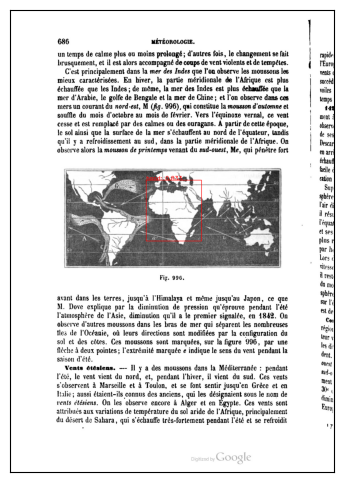

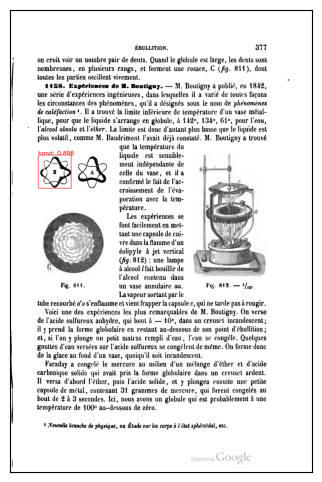

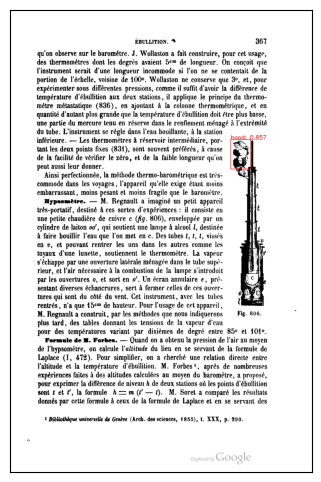

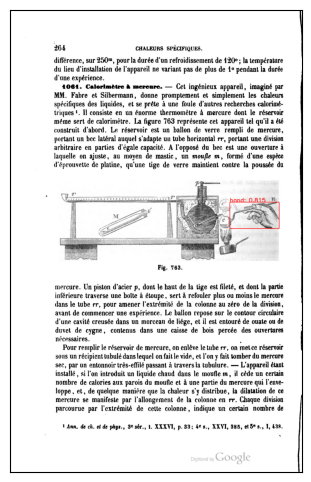

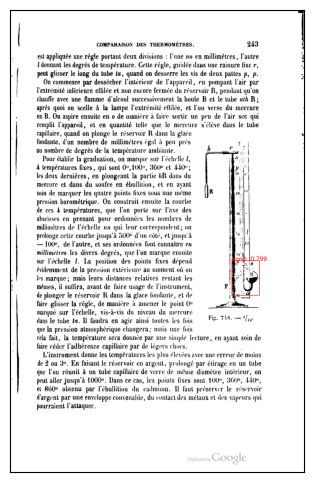

...

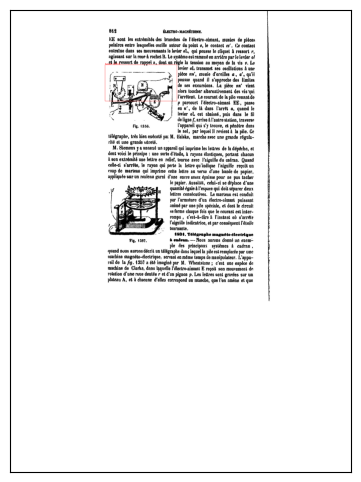

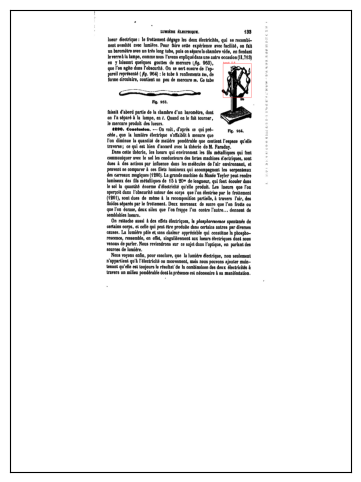

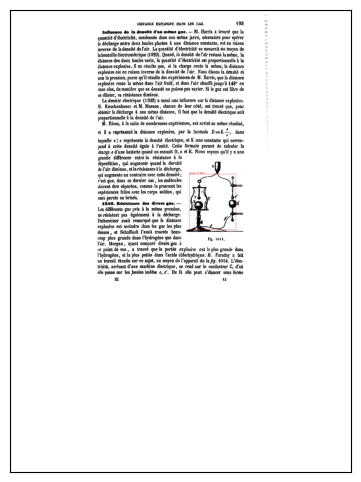

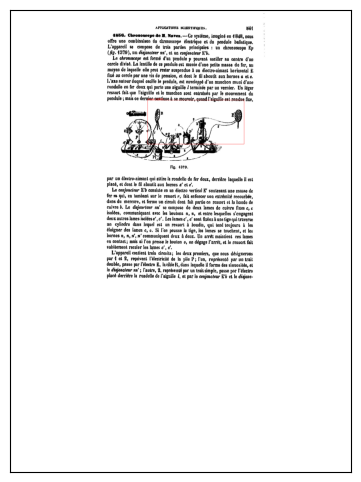

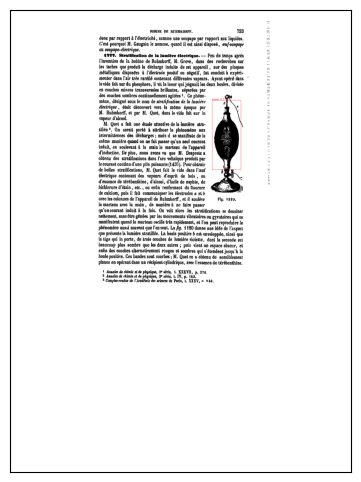

UnidentifiedImageError: cannot identify image file '/scratch/ndillenb/books_images/images/DAGUIN_3.pdf'

In [8]:
import os, random
device = torch.device('cuda') if torch.cuda.is_available() else torch.device('cpu')
CLASS_NAMES = ['__background__', 'hand']
for folder in os.listdir(path_images)[4:]:
    for image in os.listdir(os.path.join(path_images,folder)):
        #print(image)
        prediction = detect_object(os.path.join(path_images,folder,image),confidence=0.77,disable_confidence=False)
        del prediction
        torch.cuda.empty_cache()

# stack tasks

In [9]:
%matplotlib inline
from PIL import Image
import matplotlib.pyplot as plt
import torch
import torchvision.transforms as T
import torchvision
import numpy as np

import cv2
import random
import warnings
warnings.filterwarnings('ignore')


def mlt_get_prediction(imgs_path, confidence, disable_confidence):
    """
    get_prediction
    parameters:
      - img_path - path of the input image
      - confidence - threshold value for prediction score
    method:
      - Image is obtained from the image path
      - the image is converted to image tensor using PyTorch's Transforms
      - image is passed through the model to get the predictions
      - class, box coordinates are obtained, but only prediction score > threshold
        are chosen.

    """
    imgs = []
    preds_boxes = []
    preds_class = []
    preds_score = []
    for img_path in imgs_path:
        transform = T.Compose([T.ToTensor()])
        imgs.append(transform(Image.open(img_path)).to(device))
    model.eval()
    with torch.no_grad():
        preds = model(imgs)
    for i in range(len(imgs_path)):
        pred_class = [CLASS_NAMES[i] for i in list(preds[i]['labels'].cpu().numpy())]
        pred_boxes = [[(i[0], i[1]), (i[2], i[3])] for i in list(preds[i]['boxes'].detach().cpu().numpy())]
        pred_score = list(preds[i]['scores'].detach().cpu().numpy())
        if disable_confidence:
            try:
                pred_t = [pred_score.index(x) for x in pred_score if x>confidence][-1]
            except IndexError:
                pred_t = [pred_score.index(x) for x in pred_score if x>=np.max(pred_score)][-1]
            preds_boxes.append(pred_boxes[:pred_t+1])
            preds_class.append(pred_class[:pred_t+1])
            preds_score.append(pred_score[:pred_t+1])
        else:
            try:
                pred_t = [pred_score.index(x) for x in pred_score if x>confidence][-1]
                preds_boxes.append(pred_boxes[:pred_t+1])
                preds_class.append(pred_class[:pred_t+1])
                preds_score.append(pred_score[:pred_t+1])
            except IndexError:
                preds_boxes.append(None)
                preds_class.append(None)
                preds_score.append(None)
        del pred_boxes
        del pred_class
        del pred_score
    return preds_boxes, preds_class, preds_score

def mlt_detect_object(imgs_path, confidence=0.5, rect_th=2, text_size=1, text_th=2, disable_confidence=False):
    """
    object_detection_api
    parameters:
      - img_path - path of the input image
      - confidence - threshold value for prediction score
      - rect_th - thickness of bounding box
      - text_size - size of the class label text
      - text_th - thichness of the text
    method:
      - prediction is obtained from get_prediction method
      - for each prediction, bounding box is drawn and text is written 
        with opencv
      - the final image is displayed
    """
    boxes, pred_cls, pred_score = mlt_get_prediction(imgs_path, confidence, disable_confidence)
    j=0
    for img_path in imgs_path:
        if boxes[j] == None:
            #return None, None
            pass
        else:
            img = cv2.imread(img_path)
            img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
            # print(len(boxes))
            for i in range(len(boxes[j])):
                #print('pred score',str(round(pred_score[j][i],3)))
                cv2.rectangle(img, (int(boxes[j][i][0][0]),int(boxes[j][i][0][1])), (int(boxes[j][i][1][0]),int(boxes[j][i][1][1])), color=(255, 0, 0), thickness=rect_th)
                cv2.putText(img,str(pred_cls[j][i])+": "+str(round(pred_score[j][i],3)), (int(boxes[j][i][0][0]),int(boxes[j][i][0][1])), cv2.FONT_HERSHEY_SIMPLEX, text_size, (255,0,0),thickness=text_th)
            plt.figure(figsize=(6,6))
            plt.imshow(img)
            plt.xticks([])
            plt.yticks([])
            plt.show()
        j+=1
    del pred_cls
        
    return pred_score, boxes

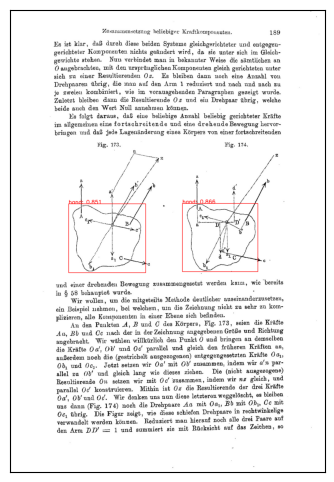

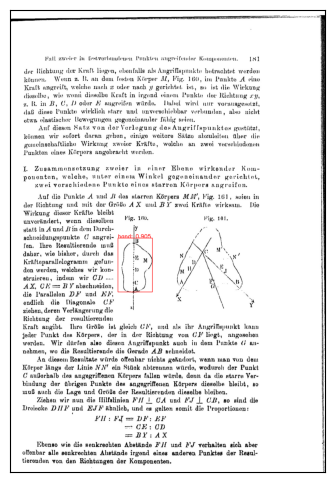

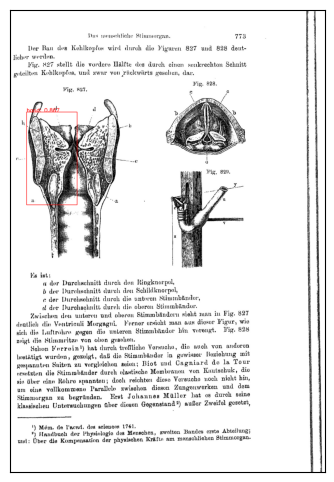

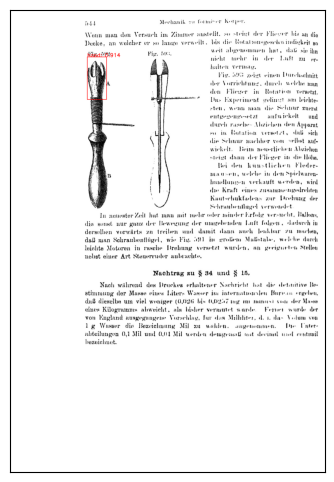

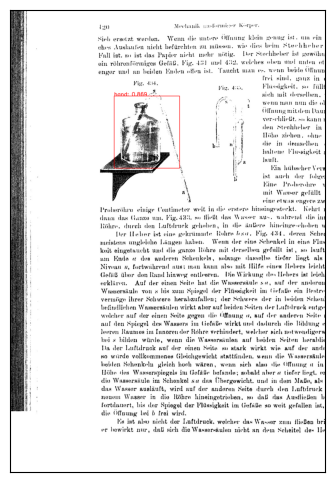

...

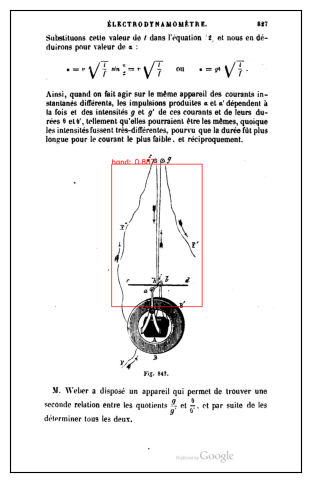

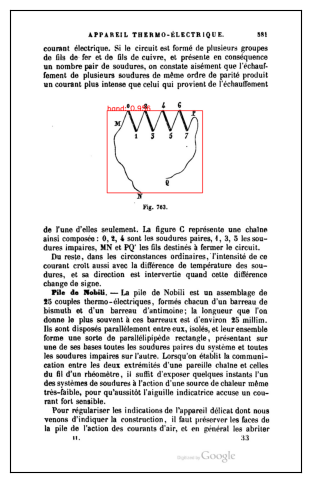

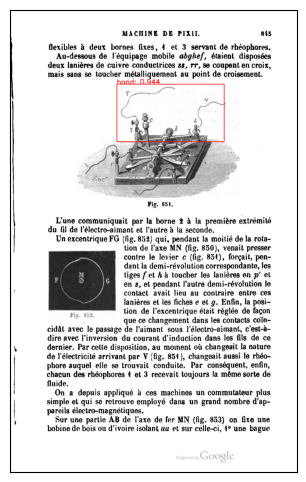

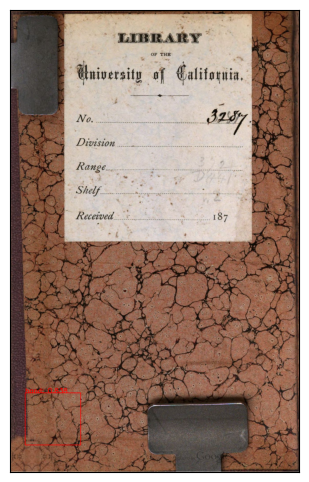

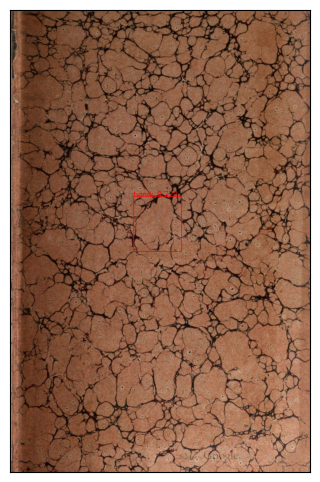

OutOfMemoryError: CUDA out of memory. Tried to allocate 594.00 MiB (GPU 0; 11.92 GiB total capacity; 10.05 GiB already allocated; 190.44 MiB free; 11.06 GiB reserved in total by PyTorch) If reserved memory is >> allocated memory try setting max_split_size_mb to avoid fragmentation.  See documentation for Memory Management and PYTORCH_CUDA_ALLOC_CONF

In [10]:
import os, random
device = torch.device('cuda') if torch.cuda.is_available() else torch.device('cpu')
CLASS_NAMES = ['__background__', 'hand']
for folder in os.listdir(path_images):
    images = []
    for image in os.listdir(os.path.join(path_images,folder)):
        images.append(os.path.join(path_images,folder,image))
        if len(images)==10 or image == os.listdir(os.path.join(path_images,folder))[-1]:
            all_pred_score, all_boxes = mlt_detect_object(images,confidence=0.77,disable_confidence=False)
            del all_pred_score
            del all_boxes
            torch.cuda.empty_cache()
            images=[]
del device

In [11]:
#del prediction
del device
torch.cuda.empty_cache()